### analysis of the output
with the already created csv that has the topics, which I have named and classified, I now want to see how they develop over time and across the communities (party, movement, media). First the topics have to be added properly and prepared

procedure: 
- if topic large enough to be analysed quantitatively, go for it, qualitative only supplementary
- if topic too small to be analysed quantitatively, then filter messages of topic by channel category and analyse qualitatively 

### step 1: prepare df_merged iwth the topics from the markdown

In [1]:
import pandas as pd
df = pd.read_csv("bigcsvwithtopicsanalysed.csv")

In [2]:
columns_to_drop = ['thread', 'broad topic', 'topic_big_analysed', 'topicname_big', 'thoughts_big']
df.drop(columns=columns_to_drop, inplace=True, errors='ignore')
print(df.columns)

Index(['message_id', 'channel_name', 'channel_category', 'text', 'text_clean',
       'views', 'view_threshold', 'datetime', 'link_to_message',
       'could_be_displayed', 'user_link', 'nb_links', 'links', 'user',
       'word_count', 'topic', 'topic_big', 'word_count_range'],
      dtype='object')


In [11]:
import pandas as pd
from io import StringIO

markdown_table = """
|theme | topic_big_analysed | topicname_big |topicname_aggregated_big_english |
 |:---------- | :----- |:---- |:---- |
| covid|  5 | masken  |covid|
| political_issues|  6 | nato  |nato|
| political_issues|  7 | twitter  |twitter |
| political_issues|  11 | electric_cars   | electric_cars|
| political_issues|  12 | nordstream   |nordstream |
| political_issues|  381 | electricity_prices   | electricity_prices|
| covid|  13 | vaccine | covid |
| covid|  33 | vaccine | covid |
| covid|  16 | covid_hysteria  | covid|
| right_wing|  17 |trump|trump |
|conspiracy|18| virus_war| virus_war|
| anti_left|  20 |antifa| antifa|
| political_criticism|  23 | politics_police  | politics_police|
| russia|  24 | putin |russia |
| russia|  47 | russia_generell | russia|
| covid|  25 | vaccine | covid |
| democracy|  1047 | no_real_election | no_democracy |
| democracy|  3213 | election_problem | no_democracy| 
| political_criticism|  715 | fascism | no_democracy |
| counterknowledge|  674 | verstehen_verstand | critique_other|
| local_activism|  325 | stundenten_aktivismus | activism_org|
| local_activism|  1016 | stundenten_aktivismus_info | activism_org |
| anti_elite|  5305 |harvard_elite| anti_elite|
| anti_elite|  586 |anti_elite_generell| anti_elite|
| democracy|  132 |democracy_generell|no_democracy |
| conspiracy|  5264 |johnshopkins_elite| anti_elite|
| conspiracy|  2032 |illuminati| conspiracy_theory|
| conspiracy|  3843 |democracy_satan| conspiracy_theory| |
| counterknowledge|  1198 |truth_relative_positivist| counterknowledge|
| censorship|  2297 |truthministry| censorship|
| censorship|  3151 |truthministry|censorship |
| censorship|  4199 |panicmedia| censorship|
| political_criticism|  1145 | lockdownagainstpeople  |conspiracy_theory |
| political_criticism|  889 | wakeup  | conspiracy_theory|
| conspiracy|  751 | warpreparation  | conspiracy_theory|
| conspiracy|  616 | international_organisation_conspiracy  | conspiracy_theory|
| political_criticism|  2405 | partystate  |no_democracy |
| political_criticism|  116 | federalinstitutions  |no_democracy |
| political_criticism|  2613 | 2021election  | no_democracy|
| political_criticism|  6398 | politicians_divide  |no_democracy |
| political_criticism|  1775 | jens_spahn_criticism | no_democracy|
| political_criticism|  2327 | jens_spahn_criticism|no_democracy |
| political_criticism|  9074 | jens_spahn_criticism |no_democracy |
| political_criticism|  970 | gov_are_enemies | no_democracy|
| political_criticism|  821 | verfassungsschutz | no_democracy|
| political_criticism|  225 | system_critique | no_democracy|
| democracy|  6334 | against_violence|critique_other|
| covid|  6279 | vaccine |  covid|
| conspiracy|  664 | all_is_plan  | conspiracy_theory|
| covid|  1754 | plandemic  | covid|
| covid|  34 | lockdown  |covid |
| covid|  2744 | vaccine  |covid |
| covid|  470 | vaccine  | covid|
| covid|  101 | pandemic_generell  |covid |
| covid|  467 | pandemic_treaty  | covid|
| covid|  446 | recovered_status  | covid|
| censorship|  1022 | dsa_criticism   |censorship |
| political_criticism|  533 | people_sovereign  | no_democracy|
| political_issues|  495 | farmers_protest  |farmers_protest |
| political_issues|  5101 | farmers_protest  | farmers_protest|
| political_criticism |  81 | science_message_union  | critique_other|
| counterknowledge|  1127 | counterexperts  | counterknowledge|
| counterknowledge | 1621 | statistics  |counterknowledge|
| political_criticism | 5344 | international_law  |critique_other|
| local_activism | 796 | demo_magdeburg  | activism_local|
|local_activism | 1392 | demo_hamburg |activism_local |
|local_activism | 2929 | demo_rostock |activism_local |
|local_activism | 3040 | demo_berlin_august |activism_local |
|local_activism | 1341 | demo_berlin| activism_local|
|local_activism | 8362 |demo_donauwörth|activism_local |
|local_activism | 387 | walks_generell|activism_local |
|diebasis | 1358 | sachsen_diebasis_demo| activism_local|
|diebasis | 8092 | diebasisinterviews| diebasis|
|political_issues|  904 | smart_cities  | smart_cities|
|political_issues|  1400 | e_id |e_id |
|conspiracy|  7055 | e_id | e_id|
| right_wing|  2925 |great_replacement|conspiracy_theory|
|conspiracy|  604 | rockefeller |conspiracy_theory|
|conspiracy|  5360 | secret_plan |conspiracy_theory|
|conspiracy|  579 | freemasons |conspiracy_theory|
|conspiracy|  123 | gates |conspiracy_theory|
|conspiracy|  1305 | gates |conspiracy_theory|
|conspiracy|  1261 | gates |conspiracy_theory|
|conspiracy|  4005 | information_war |conspiracy_theory|
|conspiracy|  1305 | wef |conspiracy_theory|
|conspiracy|  941 | reichsburger |conspiracy_theory|
|conspiracy|  9422 | reichsburger |conspiracy_theory|
|conspiracy|  3348 | reichsburger |conspiracy_theory|
| anti_left|  249 |volksverpetzer_criticism|critique_other|
| anti_left|  113 |antifeminism_gender_language|antifeminism|
| anti_left|  1361 |antifeminisms_gender_scandal|antifeminism|
| anti_left|  580 |antifeminisms_children|antifeminism|
| anti_left|  1361 |antifeminisms_gender_scandal|antifeminism|
| political_criticism|  356 | antisemitism_generell  |antifeminism|
| political_criticism|  257 | antifa  |antifa |
| counterknowledge|  237 | counterexpert_daniele_ganser  |counterknowledge|
| counterknowledge|  4715 | science_resistance  |counterknowledge|
| counterknowledge|  587 | counterexpert_gunnar_kaiser |counterknowledge|
| counterknowledge|  1282 | inside_worldbank_reset  |conspiracy_theory|
| political_criticism|  183 | conspiracy_theorist  |conspiracy_theory|
| political_criticism|  821 | verfassungsschutz  |no_democracy|
| political_criticism|  1873 | freedom_of_speech  |no_democracy|
| political_issues|  1068 | myanmar_coup  |myanmar_coup|
| counterknowledge|  747 | factchecker_critique  |counterknowledge|
| counterknowledge|  1282 | inside_worldbank_reset  |conspiracy_theory|
|counterknowledge | 1205 | counterexpert_martin_schwab|counterknowledge|
|diebasis | 7120 | diebasisinterviews|diebasis |
|diebasis | 8661 | diebasis_lifestyle| diebasis|
|diebasis | 3083 | diebasis_contribute|diebasis |
|diebasis | 3935 | diebasis_info| diebasis|
|diebasis | 7107 | diebasis_lifestream| diebasis|
|diebasis | 4480 | diebasis_machtbegrenzung_spende|diebasis |
|diebasis | 6933 | diebasis_gesundheit|diebasis |
|political_criticism | 4638 | against_parties|no_democracy|
|diebasis | 2062 | diebasis_spende|diebasis|
|diebasis | 5709 | diebasis_aktivebeteiligung| diebasis| 
|diebasis | 1931 | diebasis_hashtags|diebasis |
|diebasis | 2302 | diebasis_doppelspitze|diebasis|
|diebasis | 8786 | diebasis_mitentscheiden|diebasis|
|diebasis | 7935 | diebasis_vorstellung|diebasis|
|diebasis | 5188 | diebasis_hashtags|diebasis |
|diebasis | 1757 | diebasis_hashtags|diebasis|
|diebasis | 3436 | diebasis_shortmessages| diebasis|
|diebasis | 7965 | diebasis_shortmessages| diebasis|
|diebasis | 5226 | diebasis_akademie | diebasis|
|diebasis | 6665 | diebasis_podcast|diebasis |
|diebasis | 4493 | diebasisradio|diebasis |
|diebasis | 7209 | diebasis_generell|diebasis |
|political_issues|  27 | hamas_gaza  | hamas_gaza|
|political_issues|  28 | europa_generell  |eu_politics |
|political_issues|  31 | leopard_tanks  |leopard_tank |
|political_issues|  32 | taliban_afghanistan  | taliban_afghanistan|
|political_issues|  33 | vaccine  |covid |
|political_issues|  40 | julian_assange_wikileaks  |wikileaks|
|anti_left|  41 | climate_change  |climate_change|
|anti_left|  43 | habeck  |habeck|
|anti_left|  44 | co2_emissionen  |climate_change|
|right_wing|45| migration |migration|
|political_issues|  48 | inflation  |inflation|
|critique_other|  50 | virus  |critique_other|
|critique_other|  51 | against_left_party  |critique_other|
|conspiracy|  52 | pharma_industry|conspiracy_theory|
|political_issues|  54 | gas_gazprom|gazprom|
|political_issues|  55 | jeffrey_epstein|anti_elite|
|political_issues|  61 | israel_gaza|hamas_gaza |
|political_issues|  69 | bank_suisse|bank_suisse|
|conspiracy|  70 | immune_system|conspiracy_theory|
|conspiracy|  71 | merkel|conspiracy_theory|
|conspiracy|  70 | immune_system|conspiracy_theory|
|russia|  74 | russia_discrimination|russia|
| local_activism | 75 | demo_leipzig |activism_local|
|political_issues|  80 | trucker_protests_canada|trucker_protests_canada|
|critique_other|  87 | hospitals|critique_other|
|critique_other|  90 | protest_generell|critique_other|
|democracy|  96 | citizens_dialogue_critique|no_democracy|
|political_issues|  98 | iran|iran|
|political_issues|  99 | facebook|critique_other|
"""

lines = markdown_table.strip().split("\n")[2:]  # Skip the first two header lines
data = []

for line in lines:
    # Split the line into columns based on "|"
    cols = [col.strip() for col in line.split("|")][1:-1]  # Remove leading and trailing empty items due to split

    # Remove blank spaces from the first four columns
    for i in range(min(4, len(cols))):  # Ensure we do not exceed the list index
        cols[i] = cols[i].replace(" ", "")
    
    # Ensure there are at least 3 columns (4th is optional)
    if len(cols) >= 3:
        row = {
            "theme": cols[0],
            "topic_big_analysed": cols[1],
            "topicname_big": cols[2],
            "topicname_aggregated_big_english": cols[3] if len(cols) > 3 else ""  # Add thoughts big if present, else empty string
        }
        data.append(row)

# Convert the list of dictionaries into a DataFrame
df_topics = pd.DataFrame(data)

# Assuming you want to proceed with saving this DataFrame to a CSV file
#df_topics.to_csv("topictable.csv", index=False)

In [12]:
df_topics_print = df_topics
df_topics_print.iloc[:, [1,2,3,0]]

,topic_big_analysed,topicname_big,topicname_aggregated_big_english,theme
0,5,masken,covid,covid
1,6,nato,nato,political_issues
2,7,twitter,twitter,political_issues
3,11,electric_cars,electric_cars,political_issues
4,12,nordstream,nordstream,political_issues
...,...,...,...,...
152,87,hospitals,critique_other,critique_other
153,90,protest_generell,critique_other,critique_other
154,96,citizens_dialogue_critique,no_democracy,democracy
155,98,iran,iran,political_issues


In [5]:
df_topics_print.to_csv("topics.csv") # this put in paper

In [13]:
print(df_topics.columns)
print(df_topics['theme'].unique())
print(df_topics['theme'].nunique())
print(df_topics['topic_big_analysed'].unique())
print(df_topics['topic_big_analysed'].nunique())
print(df_topics['topicname_big'].unique())
print(df_topics['topicname_big'].nunique())
print(df_topics['topicname_aggregated_big_english'].unique())
print(df_topics['topicname_aggregated_big_english'].nunique())

Index(['theme', 'topic_big_analysed', 'topicname_big',
       'topicname_aggregated_big_english'],
      dtype='object')
['covid' 'political_issues' 'right_wing' 'conspiracy' 'anti_left'
 'political_criticism' 'russia' 'democracy' 'counterknowledge'
 'local_activism' 'anti_elite' 'censorship' 'diebasis' 'critique_other']
14
['5' '6' '7' '11' '12' '381' '13' '33' '16' '17' '18' '20' '23' '24' '47'
 '25' '1047' '3213' '715' '674' '325' '1016' '5305' '586' '132' '5264'
 '2032' '3843' '1198' '2297' '3151' '4199' '1145' '889' '751' '616' '2405'
 '116' '2613' '6398' '1775' '2327' '9074' '970' '821' '225' '6334' '6279'
 '664' '1754' '34' '2744' '470' '101' '467' '446' '1022' '533' '495'
 '5101' '81' '1127' '1621' '5344' '796' '1392' '2929' '3040' '1341' '8362'
 '387' '1358' '8092' '904' '1400' '7055' '2925' '604' '5360' '579' '123'
 '1305' '1261' '4005' '941' '9422' '3348' '249' '113' '1361' '580' '356'
 '257' '237' '4715' '587' '1282' '183' '1873' '1068' '747' '1205' '7120'
 '8661' '3083' '3

In [14]:
print(f"Data type of 'topic_big' in df: {df['topic_big'].dtype}")
print(f"Data type of 'topic_big_analysed' in df_topics: {df_topics['topic_big_analysed'].dtype}")

Data type of 'topic_big' in df: int64
Data type of 'topic_big_analysed' in df_topics: object


In [15]:
df_topics['topic_big_analysed'] = df_topics['topic_big_analysed'].astype(int)

In [16]:
# Now perform the merge
df_merged = pd.merge(df, df_topics, left_on='topic_big', right_on='topic_big_analysed', how='left')
print(df_merged.columns.tolist())

['message_id', 'channel_name', 'channel_category', 'text', 'text_clean', 'views', 'view_threshold', 'datetime', 'link_to_message', 'could_be_displayed', 'user_link', 'nb_links', 'links', 'user', 'word_count', 'topic', 'topic_big', 'word_count_range', 'theme', 'topic_big_analysed', 'topicname_big', 'topicname_aggregated_big_english']


### step 2: remove media category from channel_category (meaningless)

In [17]:
df_merged['channel_category'] = df_merged['channel_category'].replace('media', 'movement')
print(df_merged['channel_category'].nunique())

2


### step 3: prepare weighting for relative size of community

In [18]:
total_counts_by_category = df_merged.groupby('channel_category').size().reset_index(name='total_count')
counts_sum = sum(total_counts_by_category['total_count'].unique())
counts = total_counts_by_category['total_count'].unique()
proportions = (counts / counts_sum)
total_counts_by_category['proportions'] = proportions
counts

array([1069064,   22673])

this is not adjusted to proportions

In [178]:
### "counts" contains n messagess/channel category
counts

array([1069064,   22673])

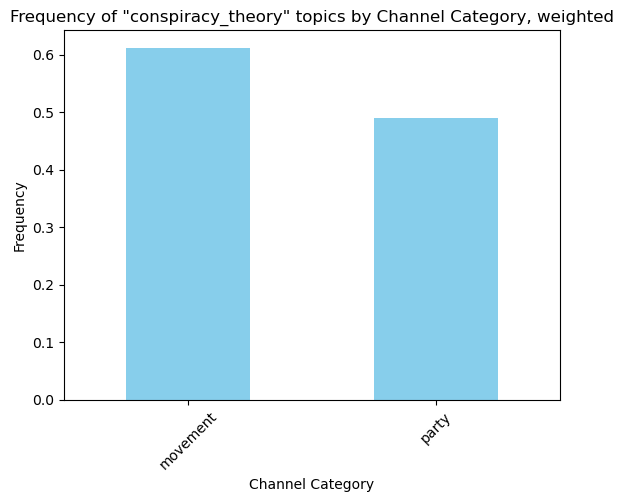

In [19]:
###how often 
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df_merged is your DataFrame
# Filter for rows where 'broad topic' is 'diebasis'
conspiracy_df = df_merged[df_merged['topicname_aggregated_big_english'] == "conspiracy_theory"]

# Group by 'channel_category' and count the occurrences
category_counts_v = conspiracy_df['channel_category'].value_counts()
weighted_category_counts_v = category_counts_v/counts*100

# Plotting
weighted_category_counts_v.plot(kind='bar', color='skyblue')
plt.title('Frequency of "conspiracy_theory" topics by Channel Category, weighted')
plt.xlabel('Channel Category')
plt.ylabel('Frequency')
plt.xticks(rotation=45)  # Rotate labels to improve readability
plt.show()

### message frequency per channel_category

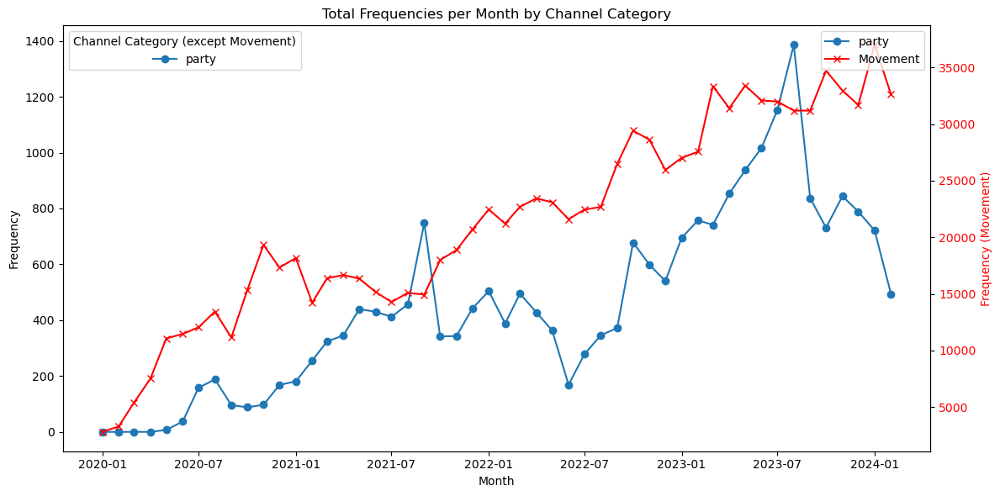

In [20]:
##create monthly_frequencies as a baseline
df_merged['datetime'] = pd.to_datetime(df_merged['datetime'])
df_merged['year_month'] = df_merged['datetime'].dt.to_period('M')
monthly_frequencies = df_merged.groupby(['channel_category', 'year_month']).size().unstack('channel_category', fill_value=0)

import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Ensure the index is correctly set to DatetimeIndex for plotting (if not already)
monthly_frequencies.index = monthly_frequencies.index.to_timestamp()
monthly_frequencies = monthly_frequencies.iloc[:-1]

# Continue with your plotting or analysis...


fig, ax1 = plt.subplots(figsize=(12, 6))

# Iterate over columns (channel categories), excluding 'movement'
for category in [cat for cat in monthly_frequencies.columns if cat != 'movement']:
    ax1.plot(monthly_frequencies.index, monthly_frequencies[category], label=category, marker='o')

ax1.set_xlabel('Month')
ax1.set_ylabel('Frequency')
ax1.tick_params(axis='y')
ax1.legend(loc='upper left', title='Channel Category (except Movement)')

# Create a second y-axis for the 'movement' category, if it exists in the columns
if 'movement' in monthly_frequencies.columns:
    ax2 = ax1.twinx()
    ax2.plot(monthly_frequencies.index, monthly_frequencies['movement'], label='Movement', marker='x', color='red')
    ax2.set_ylabel('Frequency (Movement)', color='red')
    ax2.tick_params(axis='y', labelcolor='red')

    # Combine legends from both axes
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='upper right')

### add significant events to show why growth
significant_events = {
    '2021-09': 'Federal Election',
    '2023-04': 'New Federal Board',
}
## I do not like the vertical lines
'''
for date, event_label in significant_events.items():
    date_datetime = pd.to_datetime(date)  # Convert string to datetime
    plt.axvline(x=date_datetime, color='grey', linestyle='--', lw=2)  # Use the datetime object here
    # For the text, it's okay to use the string date directly, or adjust as needed
    plt.text(x=date_datetime, y=plt.ylim()[1], s=event_label, rotation=45, color='grey', ha='right')
'''

plt.title('Total Frequencies per Month by Channel Category')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('monthly_messages_bychannel_category.png', dpi=300)  # Adjust dpi for desired resolution
plt.show()


**party:**

spikes in activity in party around Bundestagswahl 2021 (clearly) -> strategic communication, here it matters; then it is reduced because unsuccessful; lowpoint July 2022; then strong increase until August 2023, then drop again
-> strategic communication for BUndestagswahl, then Mitgliederaustritt, jetzt Neuaufstellung und wieder mehr messages

**movement** 
steady increase overall

which topics are salient at that time? 

In [21]:
# Ensure 'datetime' is the correct dtype
df_merged['datetime'] = pd.to_datetime(df_merged['datetime'])

# Define periods of interest
periods = ['2021-09', '2023-08' ]

for period in periods:
    print(f"Top topics for {period}:")
    # Filter for 'party', the specific month, and year
    df_period = df_merged[(df_merged['channel_category'] == 'party') &
                          (df_merged['datetime'].dt.to_period('M') == period)]
    
    # Find top 5 topics
    top_topics = df_period['topicname_big'].value_counts().head(5).index
    
    for topic in top_topics:
        print(f"\nTopic: {topic}")
        # Filter for messages from this topic
        messages = df_period[df_period['topicname_big'] == topic]['text'].unique()[:2]
        for message in messages:
            print(f"- {message}")
    print("\n" + "-"*50 + "\n")

Top topics for 2021-09:

Topic: diebasis_hashtags
- 🟧🟧🟥🟥🟦🟦🟩🟩#wählbar -Gute Gründe für DieBasis Neulich in der SchuleWas will dieBasis in der Bildungspolitik? Unsere Lehrerin unterrichtet über die besten Konzepte. 🟧🟧🟥🟥🟦🟦🟩🟩
- Kanzlerstatement. Dr.Reiner Füllmich Kanzlerkandidat der Partei dieBasis👍💪#dubistdiebasis #diebasissiwi 🟩🟦🟥🟧

Topic: diebasis_shortmessages
- 🟩🟩🟦🟦🟥🟥🟧🟧‼️Endlich ist es soweit: Bundestagswahl 2021!‼️Heute kommt es auf Dich an!Los schicke es an alle Deine Freunde und Bekannte und nimm Deine Nachbarn gleich mit zu wählen 😉.beide Stimmen: dieBasis!!Du bist dieBasis.🟩🟩🟦🟦🟥🟥🟧🟧#bundestagswahl #BTW2021 #demokratie #basisdemokratie #mitbestimmung #diebasispartei #diebasis #machtbegrenzung #freiheit #achtsamkeit #schwarmintelligenz #dubistdiebasis
- Neulich beim Arzt 😁. 🟩🟦🟥🟧#dubistdiebasis #duhastdiewahl

Topic: immune_system
- 🟩🟩🟦🟦🟥🟥🟧🟧Unsere “Erste Hilfe” für ein gutes Immunsystem!🟩🟩🟦🟦🟥🟥🟧🟧
- Hier habe ich noch etwas ganz feines gefunden, was hältst du denn davon ? Mit der neue

### inspect individual topics per channel category, weighted/unweighted

huge function: plot_frequencies_combined(df_merged, "topic_name" or keywords, channel_counts)

this function changes the visualisaiton to have movement on a separate axis in the weighted graph but deosnt make sense
def plot_frequencies_combined(df, topic_name, channel_counts, figsize=(20, 6)):
    df_topic = df[df['topicname_big'].str.lower() == topic_name.lower()].copy()
    df_topic['year_month'] = df_topic['datetime'].dt.to_period('M')

    monthly_counts = df_topic.groupby(['channel_category', 'year_month']).size().unstack(fill_value=0)
    monthly_counts.columns = monthly_counts.columns.to_timestamp()  # Convert columns for plotting
    monthly_counts = monthly_counts.loc[:, monthly_counts.columns < '2024-03']  # Exclude data from March 2024 onwards

    # Explicitly convert to float to avoid warning when performing division
    monthly_counts = monthly_counts.astype(float)

    # Plot setup
    fig, axs = plt.subplots(1, 2, figsize=figsize)
    
    # Plot Unweighted Frequency
    monthly_counts.T.plot(kind='line', marker='o', ax=axs[0])
    axs[0].set_title(f'Unweighted Frequency of "{topic_name}"')
    axs[0].set_xlabel('Month')
    axs[0].set_ylabel('Frequency')
    axs[0].tick_params(axis='x', rotation=45)
    axs[0].legend(title='Channel Category')

    # Calculate Weighted Frequency
    weighted_counts = monthly_counts.copy()
    for category in weighted_counts.index:
        total_count = channel_counts.get(category, 1)  # Default to 1 if not found
        weighted_counts.loc[category] = weighted_counts.loc[category] / total_count

    # Create a secondary Y-axis for "movement"
    ax2 = axs[1].twinx()
    
    # Plot "party" on the original axis (left Y-axis)
    if 'party' in weighted_counts.index:
        weighted_counts.loc['party'].T.plot(kind='line', marker='o', ax=axs[1], color='orange', label='Party (left Y-axis)')
        axs[1].set_ylabel('Weighted Frequency (Party)')
        axs[1].legend(loc='upper left')

    # Plot "movement" on the secondary Y-axis (right Y-axis)
    if 'movement' in weighted_counts.index:
        weighted_counts.loc['movement'].T.plot(kind='line', marker='x', ax=ax2, color='blue', label='Movement (right Y-axis)')
        ax2.set_ylabel('Weighted Frequency (Movement)', color='blue')
        ax2.tick_params(axis='y', labelcolor='blue')
        ax2.legend(loc='upper right')

    axs[1].set_title(f'Weighted Frequency of "{topic_name}" by Channel Category Over Time')
    axs[1].set_xlabel('Month')
    axs[1].tick_params(axis='x', rotation=45)

    plt.tight_layout()
    plt.show()

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
def plot_frequencies_combined(df, topic_name, channel_counts, figsize=(20, 6)):
    df_topic = df[df['topicname_big'].str.lower() == topic_name.lower()].copy()
    df_topic['year_month'] = df_topic['datetime'].dt.to_period('M')

    monthly_counts = df_topic.groupby(['channel_category', 'year_month']).size().unstack(fill_value=0)
    monthly_counts.columns = monthly_counts.columns.to_timestamp()  # Convert columns for plotting
    monthly_counts = monthly_counts.loc[:, monthly_counts.columns < '2024-03']  # Exclude data from March 2024 onwards

    # Explicitly convert to float to avoid warning when performing division
    monthly_counts = monthly_counts.astype(float)

    # Plot setup
    fig, axs = plt.subplots(1, 2, figsize=figsize)
    
    # Plot Unweighted Frequency
    monthly_counts.T.plot(kind='line', marker='o', ax=axs[0])
    axs[0].set_title(f'Unweighted Frequency of "{topic_name}"')
    axs[0].set_xlabel('Month')
    axs[0].set_ylabel('Frequency')
    axs[0].tick_params(axis='x', rotation=45)
    axs[0].legend(title='Channel Category')

    # Calculate and Plot Weighted Frequency
    weighted_counts = monthly_counts.copy()
    for category in weighted_counts.index:
        total_count = channel_counts.get(category, 1)  # Get total count or default to 1 if not found
        weighted_counts.loc[category] = weighted_counts.loc[category] / total_count

    weighted_counts.T.plot(kind='line', marker='o', ax=axs[1])
    axs[1].set_title(f'Weighted Frequency of "{topic_name}" by Channel Category Over Time')
    axs[1].set_xlabel('Month')
    axs[1].set_ylabel('Weighted Frequency')
    axs[1].tick_params(axis='x', rotation=45)
    axs[1].legend(title='Channel Category')

    # either save it to 'graphs' directory or just display it
    directory = "graphs"
    if not os.path.exists(directory):
        os.makedirs(directory)


    plt.savefig(f'{directory}/monthly_{topic_name}_frequency_weighted_and_unweighted.png', dpi=300, bbox_inches='tight')
    plt.close(fig)  # Close the figure after saving to avoid displaying it inline
    # display    
    #plt.tight_layout()
    #plt.show()


In [126]:
channel_counts = {
    'movement': 1069064,
    'party': 22673    
    }

In [127]:
keywords = df_merged['topicname_big'].unique()

for keyword in keywords:
    # Ensure keyword is a string and not None or NaN
    if pd.notnull(keyword):
        keyword_str = str(keyword)
        plot_frequencies_combined(df_merged, keyword_str, channel_counts, figsize=(20, 6))

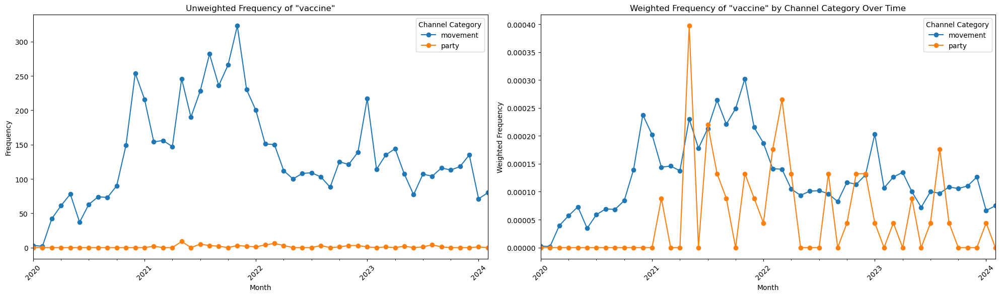

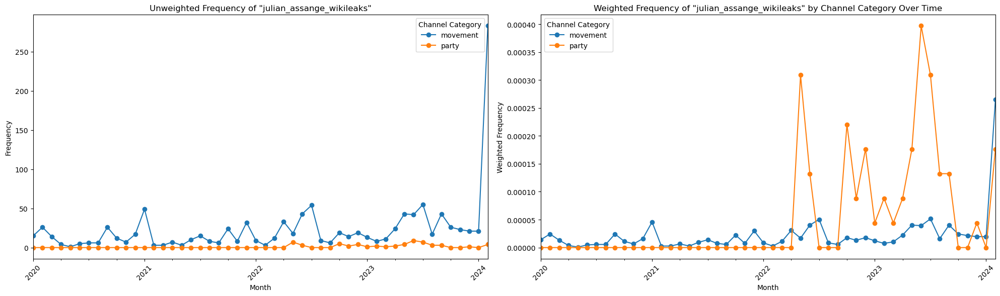

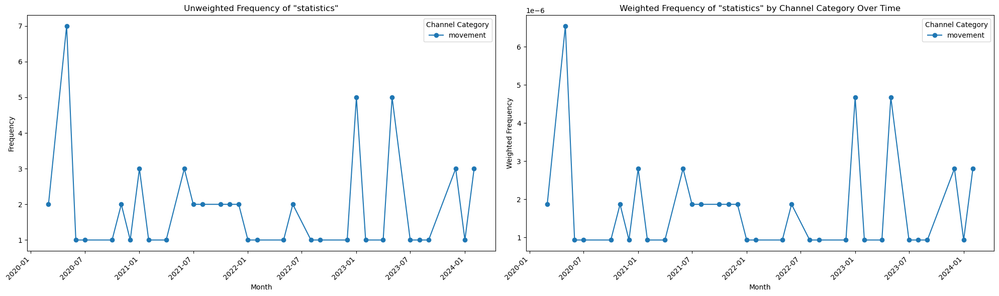

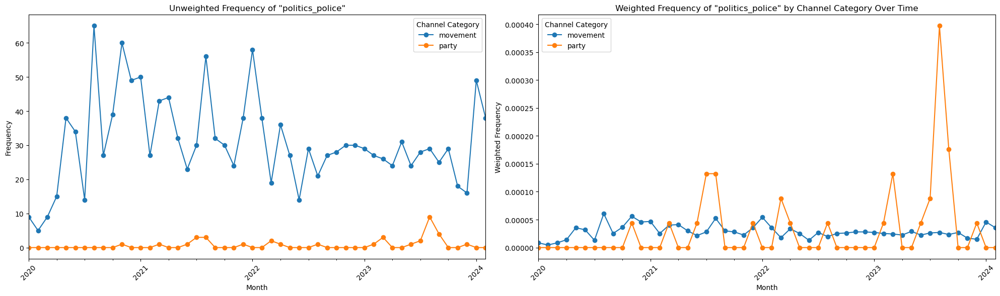

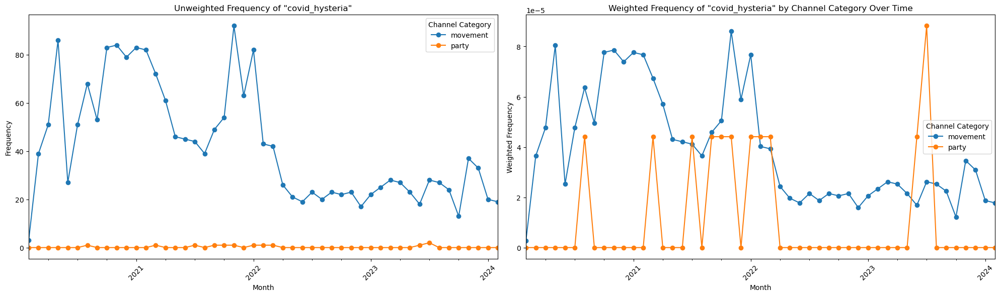

...

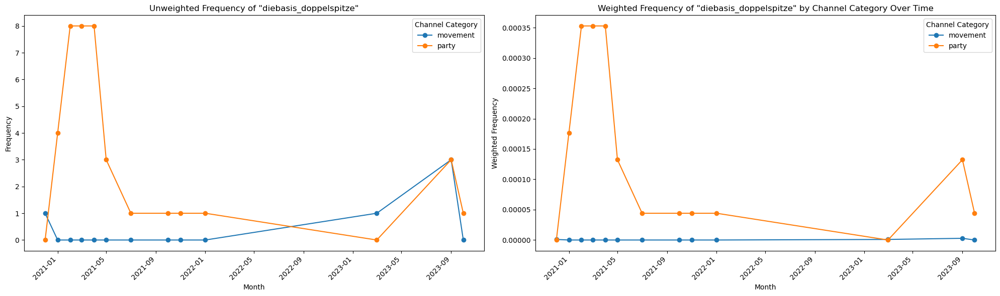

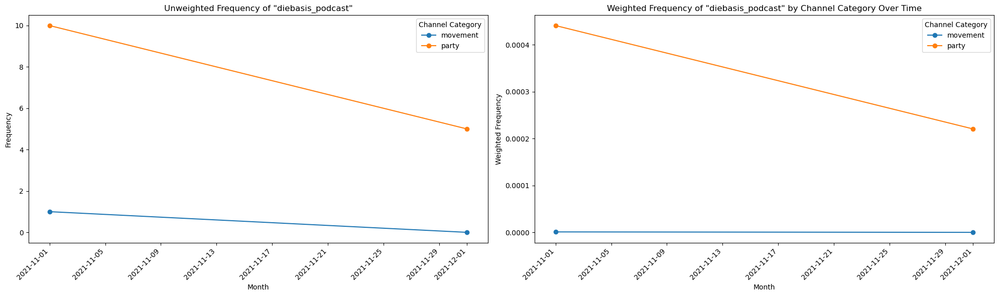

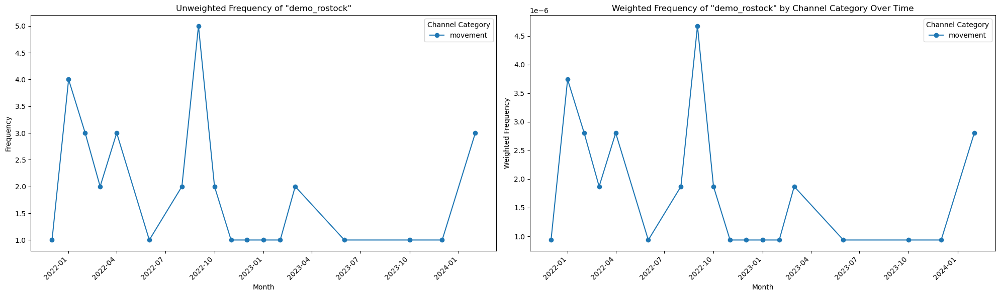

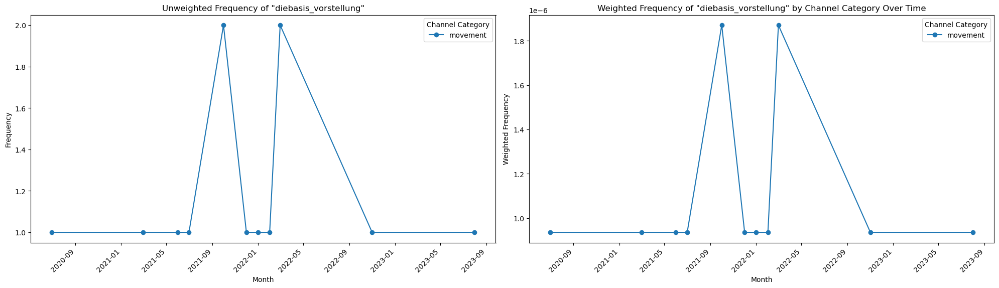

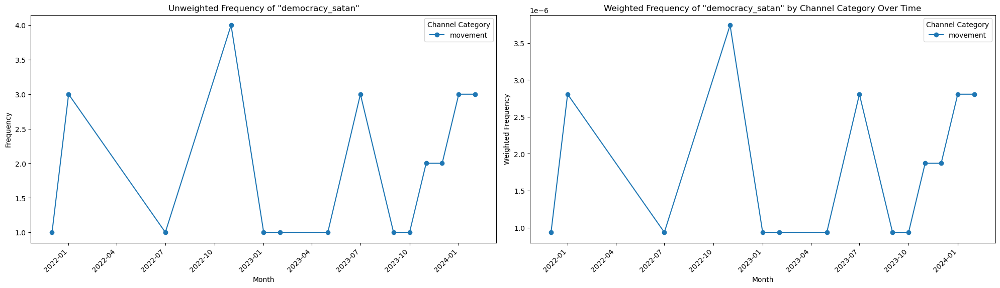

In [120]:
keywords = df_merged['topicname_big'].unique()

for keyword in keywords:
    # Ensure keyword is a string and not None or NaN
    if pd.notnull(keyword):
        keyword_str = str(keyword)
        plot_frequencies_combined(df_merged, keyword_str, channel_counts, figsize=(20, 6))


### create topic_freq_over_time with n of occurence of broad topic over time

In [168]:
broad_topic_over_time

,datetime,broad_topic_big,count
0,2020-01,anti_elite,2
1,2020-01,anti_left,45
2,2020-01,conspiracy,31
3,2020-01,counterknowledge,6
4,2020-01,covid,4
...,...,...,...
684,2024-03,local_activism,2
685,2024-03,political_criticism,4
686,2024-03,political_issues,51
687,2024-03,right_wing,4


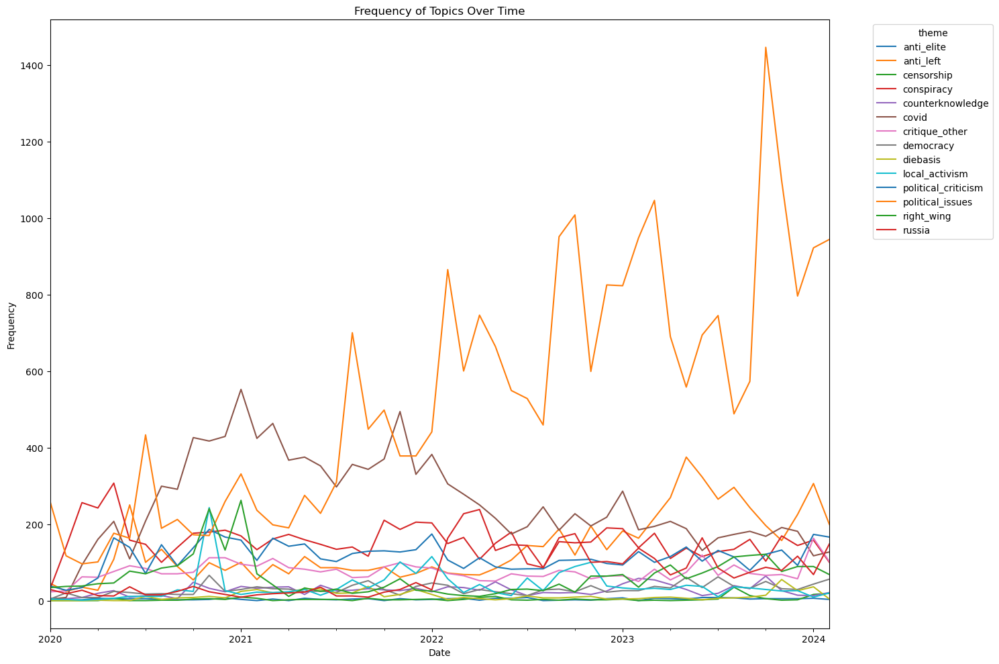

In [35]:
# Group by both 'datetime' and 'theme' and count the occurrences
df_merged['datetime'] = pd.to_datetime(df_merged['datetime'])
theme_time = df_merged.groupby([df_merged['datetime'].dt.to_period('M'), 'theme']).size().reset_index(name='count')
theme_time = theme_time[theme_time['datetime'] != "2024-03"] #remove last month

# Pivot the table to get 'datetime' on the index and topics as columns
pivot_table = theme_time.pivot(index='datetime', columns='theme', values='count').fillna(0)
pivot_table.plot(kind='line', figsize=(15, 10), legend=True, title='Frequency of Topics Over Time')

plt.xlabel('Date')
plt.ylabel('Frequency')
plt.legend(title='theme', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig("theme_over_time.png")
plt.show()

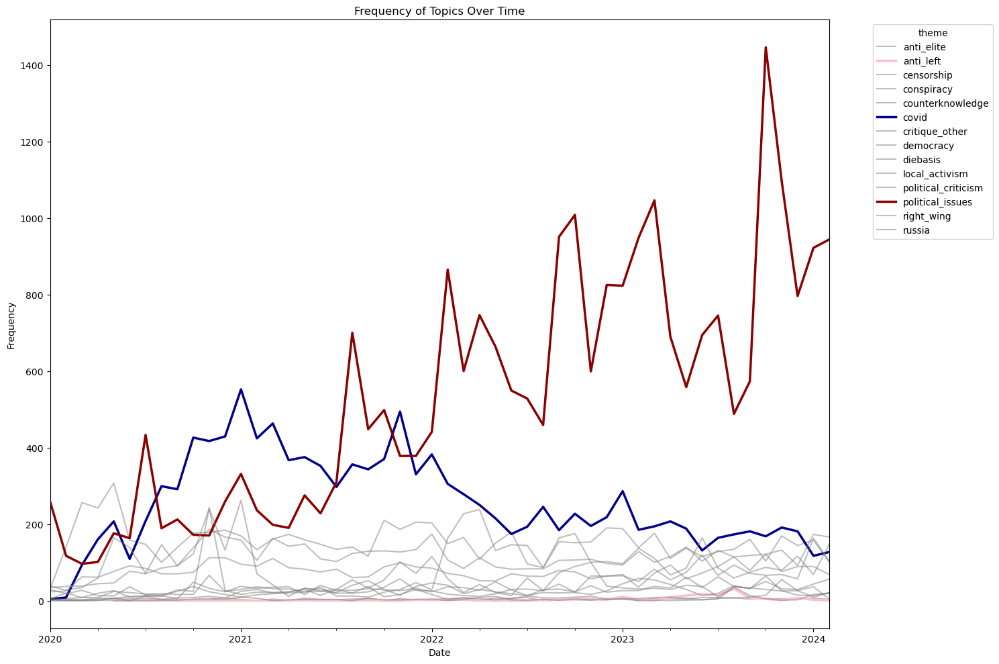

In [60]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming pivot_table is already created as per your previous steps

# Set plot size
plt.figure(figsize=(15, 10))

# Plot each column
for column in pivot_table.columns:
    if column == 'covid':
        # Dark blue for 'covid'
        pivot_table[column].plot(kind='line', legend=True, color='darkblue', linewidth=2.5)
    elif column == 'political_issues':
        # Light blue for 'political_issues'
        pivot_table[column].plot(kind='line', legend=True, color='darkred', linewidth=2.5)
    elif column == 'anti_left':
        pivot_table_2[column].plot(kind='line', legend=True, color='pink', linewidth=2.5)
    else:
        # Grey for all other topics
        pivot_table[column].plot(kind='line', legend=True, color='grey', alpha=0.5)

# Customizing the plot
plt.title('Frequency of Topics Over Time')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.legend(title='theme', bbox_to_anchor=(1.05, 1), loc='upper left')

# Set the background color of the plot area to light grey
#plt.gca().set_facecolor('#f0f0f0')
#plt.gcf().set_facecolor('lightgrey')

# Note: plt.gcf().set_facecolor changes the figure's background color, plt.gca().set_facecolor changes the axes' background color.

plt.tight_layout()
plt.savefig("plot.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
topic_freq_over_time.to_csv("broad_topic_over_time.csv")

### broad topics over time per channel category
I NEED TO ADJUST THIS TOMORROW SO IT LOOKS NICER

In [389]:
df_merged.columns

Index(['message_id', 'channel_name', 'channel_category', 'text', 'text_clean',
       'views', 'view_threshold', 'datetime', 'link_to_message',
       'could_be_displayed', 'user_link', 'nb_links', 'links', 'user',
       'word_count', 'topic', 'topic_big', 'word_count_range',
       'broad_topic_big', 'topic_big_analysed', 'topicname_big',
       'topicname_aggregated_big_english', 'keyword_match',
       'match_pandemievertrag', 'match_pandemie-vertrag',
       'match_pandemie vertrag', 'match_who-abkommen',
       'match_who-pandemie-abkommen', 'match_subsidiarität',
       'match_subsidarität', 'match_genderwahn', 'match_johanna',
       'match_findeisen', 'match_razzia', 'match_rentnerputsch',
       'match_schwarmintelligenz', 'match_machtbegrenzung',
       'match_achtsamkeit', 'match_freiheit', 'match_smart city',
       'match_smart cities', 'match_smartcity', 'match_smartcities',
       'match_kinderficker', 'match_blut trinken', 'match_digitale identität',
       'match_digi

In [45]:
len(subset2)

1069064

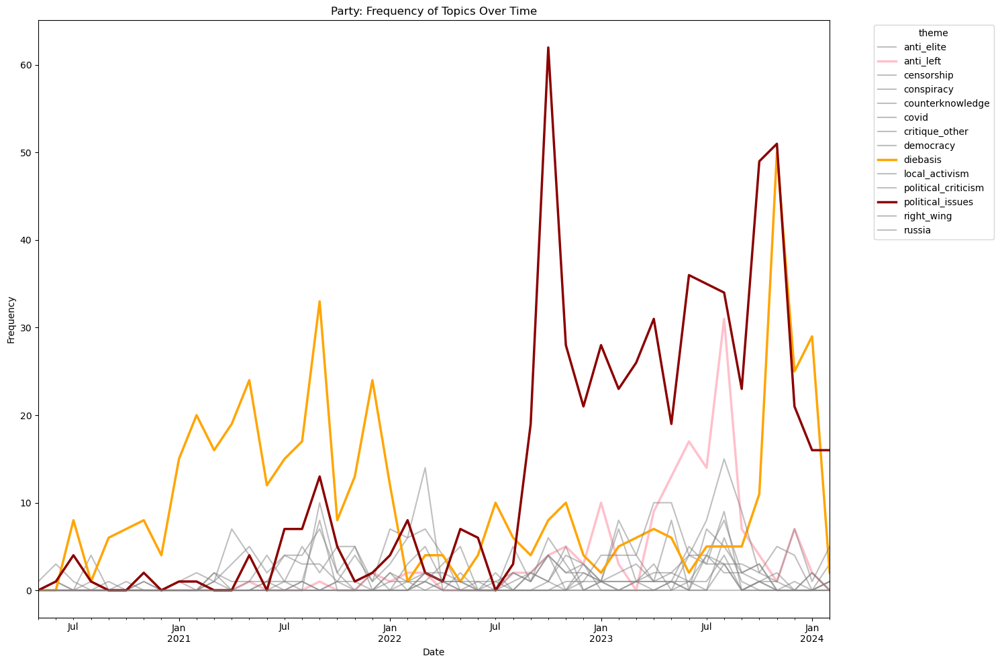

In [59]:
# Filter for 'movement'
subset2 = df_merged[df_merged['channel_category'] == 'party']

# Group by 'datetime' and 'theme', then count
broad_topic_over_time_2 = subset2.groupby([subset2['datetime'].dt.to_period('M'), 'theme']).size().reset_index(name='count')

# Pivot the table
pivot_table_2 = broad_topic_over_time_2.pivot(index='datetime', columns='theme', values='count').fillna(0)

# Plot
plt.figure(figsize=(15, 10))
for column in pivot_table_2.columns:
    if column == 'diebasis':
        pivot_table_2[column].plot(kind='line', legend=True, color='orange', linewidth=2.5)
    elif column == 'political_issues':
        pivot_table_2[column].plot(kind='line', legend=True, color='darkred', linewidth=2.5)
    elif column == 'anti_left':
        pivot_table_2[column].plot(kind='line', legend=True, color='pink', linewidth=2.5)
    else:
        pivot_table_2[column].plot(kind='line', legend=True, color='grey', alpha=0.5)

# Customizing the plot
plt.title('Party: Frequency of Topics Over Time')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.legend(title='theme', bbox_to_anchor=(1.05, 1), loc='upper left')
#plt.gca().set_facecolor('#f0f0f0')
#plt.gcf().set_facecolor('#f0f0f0')
plt.tight_layout()
plt.savefig("party_topics over time.png", dpi=300, bbox_inches='tight')
plt.show()

### what is the most frequent topic per channel and per channel category?

In [397]:
def find_top_topics_perchannel(df, channel_name):
    channel_df = df[df['channel_name'] == channel_name]
    toptopics = channel_df['topicname_big'].value_counts().head(10)
    return toptopics

In [437]:
find_top_topics_perchannel(df_merged, "ra_ludwig")

topicname_big
merkel                26
masken                23
vaccine               21
covid_hysteria        17
immune_system         12
lockdown              10
twitter               10
democracy_generell     9
demo_leipzig           7
pandemic_generell      7
Name: count, dtype: int64

RangeIndex(start=0, stop=1091737, step=1)


In [425]:
def find_top_topics_percommunity(df, channel_category):
    channel_df = df[df['channel_category'] == channel_category]
    toptopics = channel_df['topicname_big'].value_counts().head(10)
    print(f'Top 10 topics in {channel_category}-channels')
    return toptopics

In [427]:
find_top_topics_percommunity(df_merged, "party")

Top 10 topics in party-channels


topicname_big
diebasis_hashtags           122
nordstream                  107
israel_gaza                  81
sachsen_diebasis_demo        69
vaccine                      61
nato                         60
julian_assange_wikileaks     58
twitter                      57
europa_generell              44
immune_system                44
Name: count, dtype: int64

### where do topics pop up first? write function

first let's do it for individual topics, to check topics of special interest

In [214]:
def where_topics_emerge(topic_name, df_merged):
    filtered_df = df_merged[df_merged['topicname_big'] == topic_name]
    sorted_df = filtered_df.sort_values(by='datetime')
    earliest_entries = sorted_df.head(10)
    
    # Print 'channel_name', 'text', and 'datetime' for each of the earliest entries
    for index, row in earliest_entries.iterrows():
        print(f"DateTime: {row['datetime']}, Channel Name: {row['channel_name']}, Text: {row['text']}, ")
    first_datetime = sorted_df.iloc[0]['datetime']
    
    party_df = sorted_df[sorted_df['channel_category'] == 'party']
    
    # Select the first entry in the party filtered DataFrame if it exists
    if not party_df.empty:
        first_party = party_df.head(1)
        print("\nFirst party entry:")
        for index, row in first_party.iterrows():
            print(f"Channel Name: {row['channel_name']}, Text: {row['text']}, DateTime: {row['datetime']}")
        # Get the first party entry datetime
        first_party_datetime = first_party.iloc[0]['datetime']
        
        # Calculate and print the difference in datetimes
        time_difference = first_party_datetime - first_datetime
        print(f"\nTime difference between first topic and first 'party' category occurrence: {time_difference}")
    else:
        print("\nNo party entries found in the topic.")
        # If there is no party category found, indicate no time difference
        print("No time difference calculation possible.")

## where_topics_emerge("pandemic_treaty", df_merged)

now for general time differences between where topics pop up

In [225]:
import pandas as pd

def time_differences_for_all_topics(df_merged):
    # Initialize a list to store rows for the markdown table
    markdown_table = ["| Topic | Time Difference |",
                      "|-------|----------------|"]

    # Get a list of unique topics from 'topicname_big'
    unique_topics = df_merged['topicname_big'].dropna().unique()
    time_differences = []

    # Iterate over each unique topic
    for topic in unique_topics:
        filtered_df = df_merged[df_merged['topicname_big'] == topic]
        sorted_df = filtered_df.sort_values(by='datetime')

        if not sorted_df.empty:
            first_datetime = sorted_df.iloc[0]['datetime']
            party_df = sorted_df[sorted_df['channel_category'] == 'party']

            if not party_df.empty:
                first_party_datetime = party_df.iloc[0]['datetime']
                time_difference = first_party_datetime - first_datetime
                time_differences.append(time_difference)
                markdown_table.append(f"| {topic} | {time_difference} |")
            else:
                markdown_table.append(f"| {topic} | None - No party entries |")
        else:
            markdown_table.append(f"| {topic} | No entries |")

    # Calculate the average time difference
    if time_differences:
        average_difference = sum(time_differences, pd.Timedelta(0)) / len(time_differences)
        markdown_table.append(f"| **Average Time Difference** | {average_difference} |")
    else:
        markdown_table.append("| **Average Time Difference** | None |")

    # Print the entire markdown table as a single output
    markdown_output = "\n".join(markdown_table)
    print(markdown_output)
    return markdown_output

In [226]:
md_table = time_differences_for_all_topics(df_merged)

| Topic | Time Difference |
|-------|----------------|
| vaccine | 420 days 02:36:00 |
| julian_assange_wikileaks | 851 days 11:10:33 |
| statistics | None - No party entries |
| politics_police | 326 days 20:11:00 |
| covid_hysteria | 183 days 15:04:51 |
| conspiracy_theorist | 1203 days 20:32:50 |
| virus_war | 765 days 18:00:51 |
| gates | 1312 days 13:40:11 |
| twitter | 322 days 06:47:54 |
| federalinstitutions | 435 days 09:43:00 |
| merkel | 115 days 08:11:39 |
| wef | None - No party entries |
| co2_emissionen | 967 days 14:22:56 |
| trump | None - No party entries |
| masken | 456 days 11:53:14 |
| factchecker_critique | 753 days 15:10:46 |
| virus | 212 days 04:11:45 |
| citizens_dialogue_critique | 590 days 20:52:13 |
| rockefeller | None - No party entries |
| hospitals | 363 days 15:51:30 |
| science_message_union | 308 days 17:49:28 |
| immune_system | 174 days 01:02:46 |
| lockdown | 312 days 02:09:48 |
| jeffrey_epstein | 1323 days 07:26:05 |
| lockdownagainstpeople | 8

this is a huge time difference, let's account for 'late' party formation and see if it still is big within that timespan

In [233]:
def find_first_party_message_datetime(df_merged):
    # Filter for rows where 'channel_category' is 'party'
    party_df = df_merged[df_merged['channel_category'] == 'party']
    
    # Find the earliest datetime in this filtered DataFrame
    if not party_df.empty:
        first_party_row = party_df.loc[party_df['datetime'].idxmin()]
        first_party_datetime = first_party_row['datetime']
        text_first_party = first_party_row['text']
        channel_first_party = first_party_row['channel_name']
        return first_party_datetime, text_first_party, channel_first_party
    else:
        return None, None  # Return None if there are no 'party' messages

In [234]:
find_first_party_message_datetime(df_merged)

(Timestamp('2020-05-27 10:56:42'),
 '❤️ Welcome! For all other languages: 🏳️\u200d🌈🇨🇦🇪🇺🇬🇧🇾🇪🇨🇭🇧🇷🇹🇩🇩🇪🇫🇮🇬🇷🇭🇺🇮🇷🇮🇶🇺🇳... You would like to join Widerstand2020 Berlin or just want to talk to some people in our community but don´t speak German? No problem! Tell us your language and we give our best to find someone that can assist you.',
 'die_basis_berlin_funkt')

careful: using hardcoded party date here because the other function had issues

In [245]:
import pandas as pd

def time_differences_for_all_topics_after_hardcoded_party_start(df_merged):
    # Hard-code the first party message datetime
    first_party_datetime = pd.Timestamp('2020-05-27 10:56:42')

    # Filter the DataFrame to only include rows after the first party message
    df_filtered = df_merged[df_merged['datetime'] >= first_party_datetime]

    markdown_table = ["| Topic | Time Difference |",
                      "|-------|----------------|"]
    unique_topics = df_filtered['topicname_big'].dropna().unique()
    time_differences = []

    for topic in unique_topics:
        filtered_df = df_filtered[df_filtered['topicname_big'] == topic]
        sorted_df = filtered_df.sort_values(by='datetime')

        if not sorted_df.empty:
            first_datetime = sorted_df.iloc[0]['datetime']
            party_df = sorted_df[sorted_df['channel_category'] == 'party']

            if not party_df.empty:
                first_party_datetime = party_df.iloc[0]['datetime']
                time_difference = first_party_datetime - first_datetime
                time_differences.append(time_difference)
                markdown_table.append(f"| {topic} | {time_difference} |")
            else:
                markdown_table.append(f"| {topic} | None - No party entries |")
        else:
            markdown_table.append(f"| {topic} | No entries |")

    # Calculate the average time difference if there are valid entries
    if time_differences:
        average_difference = sum(time_differences, pd.Timedelta(0)) / len(time_differences)
        markdown_table.append(f"| **Average Time Difference** | {average_difference} |")
    else:
        markdown_table.append("| **Average Time Difference** | None |")

    # Convert the list to a Markdown string and print the entire table as a single output
    markdown_output = "\n".join(markdown_table)
    print(markdown_output)
    return markdown_output

# Example usage:
# Assuming 'df_merged' is your DataFrame and properly prepared
# time_differences_for_all_topics_after_hardcoded_party_start(df_merged)

In [246]:
time_differences_for_all_topics_after_hardcoded_party_start(df_merged)

| Topic | Time Difference |
|-------|----------------|
| vaccine | 275 days 03:10:31 |
| julian_assange_wikileaks | 695 days 11:02:23 |
| bank_suisse | 61 days 06:24:45 |
| virus | 73 days 06:22:17 |
| electric_cars | 399 days 02:33:18 |
| covid_hysteria | 66 days 06:56:19 |
| immune_system | 28 days 15:18:31 |
| lockdownagainstpeople | 866 days 02:46:32 |
| verstehen_verstand | 1169 days 22:07:31 |
| europa_generell | 489 days 12:02:05 |
| trump | None - No party entries |
| masken | 323 days 22:26:47 |
| counterexpert_gunnar_kaiser | 428 days 03:39:39 |
| federalinstitutions | 292 days 13:37:55 |
| science_message_union | 167 days 18:42:26 |
| hospitals | 239 days 05:56:58 |
| putin | 665 days 06:44:51 |
| lockdown | 239 days 12:37:58 |
| volksverpetzer_criticism | 457 days 20:42:48 |
| jeffrey_epstein | 1177 days 01:30:36 |
| gates | 1196 days 09:29:27 |
| system_critique | 463 days 23:50:18 |
| against_left_party | 448 days 10:05:55 |
| anti_elite_generell | 918 days 12:47:27 |
| p

'| Topic | Time Difference |\n|-------|----------------|\n| vaccine | 275 days 03:10:31 |\n| julian_assange_wikileaks | 695 days 11:02:23 |\n| bank_suisse | 61 days 06:24:45 |\n| virus | 73 days 06:22:17 |\n| electric_cars | 399 days 02:33:18 |\n| covid_hysteria | 66 days 06:56:19 |\n| immune_system | 28 days 15:18:31 |\n| lockdownagainstpeople | 866 days 02:46:32 |\n| verstehen_verstand | 1169 days 22:07:31 |\n| europa_generell | 489 days 12:02:05 |\n| trump | None - No party entries |\n| masken | 323 days 22:26:47 |\n| counterexpert_gunnar_kaiser | 428 days 03:39:39 |\n| federalinstitutions | 292 days 13:37:55 |\n| science_message_union | 167 days 18:42:26 |\n| hospitals | 239 days 05:56:58 |\n| putin | 665 days 06:44:51 |\n| lockdown | 239 days 12:37:58 |\n| volksverpetzer_criticism | 457 days 20:42:48 |\n| jeffrey_epstein | 1177 days 01:30:36 |\n| gates | 1196 days 09:29:27 |\n| system_critique | 463 days 23:50:18 |\n| against_left_party | 448 days 10:05:55 |\n| anti_elite_generell

### using REGEX for specific topics (triangulate the topic model findings with regex)

In [385]:
import pandas as pd
import re
import matplotlib.pyplot as plt

def find_keyword_instances_by_category(df, keywords):
    # Prepare the DataFrame to track matches
    df['keyword_match'] = False
    for keyword in keywords:
        # Find matches for each keyword and mark rows
        df['match_' + keyword] = df['text_clean'].str.contains(re.escape(keyword), case=False, na=False)
        df['keyword_match'] = df['keyword_match'] | df['match_' + keyword]

    # Filter DataFrame to only matched rows
    matched_df = df[df['keyword_match']].copy()
    
    # Add month column for grouping
    matched_df['month'] = matched_df['datetime'].dt.to_period('M')

    # Create a single column that captures any keyword match
    matched_df['all_keywords'] = matched_df[['match_' + k for k in keywords]].any(axis=1)
    
    # Group by month and channel category and count matches
    graph_data = matched_df.groupby(['month', 'channel_category'])['all_keywords'].sum().unstack(fill_value=0)

    # Filter out the incomplete data for the graph (e.g., March 2024)
    cutoff_date = pd.Period('2024-02', freq='M')
    graph_data = graph_data.loc[graph_data.index <= cutoff_date]

    # Plotting the results with lines for each category
    plt.figure(figsize=(12, 6))
    if 'movement' in graph_data.columns:
        graph_data['movement'].plot(kind='line', label='Movement', marker='o')
    if 'party' in graph_data.columns:
        graph_data['party'].plot(kind='line', label='Party', marker='o')
    
    plt.title('Frequency of WHO pandemic treaty Over Time by Channel Category')
    plt.xlabel('Month')
    plt.ylabel('Keyword Counts')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.savefig("regex of WHO pandemic treaty over time by channel category.png", dpi=300)
    plt.tight_layout
    plt.show()
    
    # Return the detailed DataFrame for further analysis
    detailed_df = matched_df[['datetime', 'text', 'channel_name', 'channel_category', 'message_id']]
    return detailed_df


# Example usage:
# Assuming 'df_merged' is your DataFrame and has 'datetime', 'text_clean', 'channel_name', and 'channel_category' columns properly prepared
# Keywords list as an example

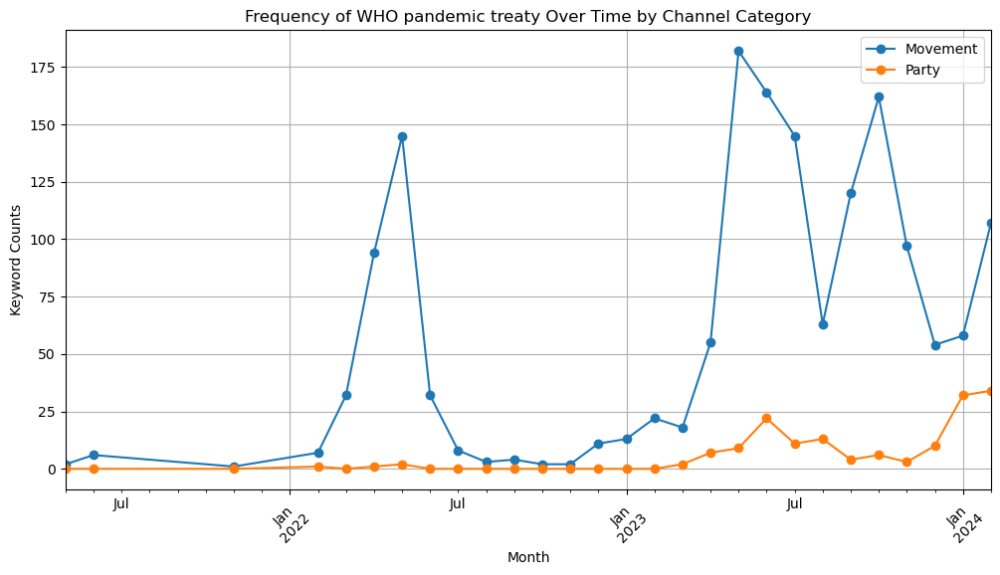

In [386]:
keywords = ["pandemievertrag", "pandemie vertrag", "pandemic treaty"]
detailed_df = find_keyword_instances_by_category(df_merged, keywords)

In [376]:
subset = detailed_df[detailed_df['channel_category'] == 'party']
subset_2023 = subset[subset['datetime'].dt.month == 8]
print(len(detailed_df))
print(len(subset))
print(len(subset_2023))

216
19
7


In [377]:
pd.set_option('display.max_columns', None)  # Ensures all columns are shown
pd.set_option('display.max_colwidth', None)
print(subset_2023[['message_id', 'text', 'channel_name']])

        message_id  \
61059        19204   
61130        19287   
61132        19297   
61213        19391   
61219        19398   
61236        19419   
198781       13151   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [ ]:
onemessage = df_merged[df_merged['topic_big'] == 5234]


### produce table per topic -> not necessary

In [ ]:
### topic frequencies not weighted
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# Assuming df_merged is your DataFrame and it's already been loaded and prepared

# Ensure 'datetime' is correctly formatted as datetime
df_merged['datetime'] = pd.to_datetime(df_merged['datetime'])

# Iterate over each unique topic
unique_topics = df_merged['topicname_aggregated_big_english'].unique()

for topic in unique_topics:
    topic_df = df_merged[df_merged['topicname_aggregated_big_english'] == topic]
    
    # Group by 'datetime' and 'channel_category', then count occurrences
    topic_freq_over_time = topic_df.groupby([topic_df['datetime'].dt.to_period('M'), 'channel_category']).size().reset_index(name='count')
    
    # Pivot the table for plotting
    pivot_table = topic_freq_over_time.pivot(index='datetime', columns='channel_category', values='count').fillna(0)
    
    # Check if the pivot table has numeric data to plot
    if not pivot_table.empty and pivot_table.select_dtypes(include=[np.number]).shape[1] > 0:
        plt.figure(figsize=(15, 10))
        pivot_table.plot(kind='line')
        plt.title(f'Frequency of "{topic}" Over Time by Channel Category')
        plt.xlabel('Date')
        plt.ylabel('Frequency')
        plt.legend(title='Channel Category', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.savefig(f'topic_frequency_{topic}.png')
        plt.close()
    else:
        print(f'No numeric data to plot for topic "{topic}".')


In [ ]:
### weighted topic frequencies
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

df_merged['datetime'] = pd.to_datetime(df_merged['datetime'])

# Convert proportions to a dictionary for easier access
proportions_dict = total_counts_by_category.set_index('channel_category')['proportions'].to_dict()

# Iterate over each unique topic
unique_topics = df_merged['topicname_aggregated_big_english'].unique()

for topic in unique_topics:
    topic_df = df_merged[df_merged['topicname_aggregated_big_english'] == topic]
    
    # Group by 'datetime' and 'channel_category', then count occurrences
    topic_freq_over_time = topic_df.groupby([topic_df['datetime'].dt.to_period('M'), 'channel_category']).size().reset_index(name='count')
    
    # Pivot the table for plotting
    pivot_table = topic_freq_over_time.pivot(index='datetime', columns='channel_category', values='count').fillna(0)
    
    # Scale the counts by the channel category proportions
    for category in pivot_table.columns:
        if category in proportions_dict:
            pivot_table[category] = pivot_table[category] / proportions_dict[category]
    
    # Check if the pivot table has numeric data to plot
    if not pivot_table.empty and pivot_table.select_dtypes(include=[np.number]).shape[1] > 0:
        plt.figure(figsize=(15, 10))
        pivot_table.plot(kind='line')
        plt.title(f'Frequency of "{topic}" Over Time by Channel Category, Adjusted for Proportions')
        plt.xlabel('Date')
        plt.ylabel('Adjusted Frequency')
        plt.legend(title='Channel Category', bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.savefig(f'topic_frequency_{topic}_adjusted.png')
        plt.close()
    else:
        print(f'No numeric data to plot for topic "{topic}".')


### create tables with the frequencies of topics (3 levels) per channel category -> also not necessary

In [ ]:
import pandas as pd

def create_pivoted_frequency_dataframe_corrected(df, column_name):
    grouped = df.groupby([column_name, 'channel_category']).size().reset_index(name='count')
    pivoted = pd.pivot_table(grouped, values='count', index=[column_name], columns=['channel_category'], fill_value=0)
    
    return pivoted

pivot_frequency_theme = create_pivoted_frequency_dataframe_corrected(df_merged, 'theme')
pivot_frequency_topicname_big = create_pivoted_frequency_dataframe_corrected(df_merged, 'topicname_big')
pivot_frequency_topicname_aggregated_big_english = create_pivoted_frequency_dataframe_corrected(df_merged, 'topicname_aggregated_big_english')

In [ ]:
# Example DataFrame to adjust
pivot_df = pivot_frequency_topicname_aggregated_big_english
total_counts_per_channel = pivot_df.sum()
adjusted_pivot_df = pivot_df.div(total_counts_per_channel, axis='columns')
adjusted_pivot_df

In [ ]:
pivot_frequency_theme.to_csv('pivot_frequency_theme.csv')
pivot_frequency_topicname_big.to_csv('pivot_frequency_topicname_big.csv')
pivot_frequency_topicname_aggregated_big_english.to_csv('pivot_frequency_topicname_aggregated_big_english.csv')

### open task: link channels by token usage -> too work intensive

tbd if it is worth it

use tokeniser (NLTK, spacy) 
-> filter out **stopwords** + hapax **threshold** for if used at least 5 tmes + tf idf if word used too frequently (upper bound threhsold)
log(doc_count/doc_where_some_token_appear)

list of vocabularies

goal: 
- bipartite between channel and token
- project onto monopartite of tokens/channels
- co-occurence graph: only tokens nodes; link the tokens if they co-ocurr 
- semantic maps


